# **Lab 18: Deep Learning with CNNs**
---

### **Description**
In today's lab you'll work through implementing image classification using Convolutional Neural Networks (CNNs). CNNs are mainly used for image/object recognition and classification. You will build a CNN model using the steps of implementing a neural net with keras.

<br>

### **Structure**

**Part 1**: [Chihuahua or Muffin?](#p1)

> **Part 1.1**: [Building a Deep Neural Network for Image Classification](#p1.1)

> **Part 1.2**: [Building a Convolutional Neural Network for Image Classification](#p1.2)



**Part 2**: [Using Pre-Trained Models](#p2)



<br>


### **Learning Objectives**
By the end of this lab, you will be able to:
* Build and train a CNN using keras.

<br>

### **Resources**
* [CNNS with keras](https://docs.google.com/document/d/1dWzbeOptutEQ3N1_kJi5uOWthrNkNa9JcrWoQ_DsABc/edit?usp=sharing)

* [Deep Learning with keras](https://docs.google.com/document/d/1WCV2ok7dwPWCid5vdOImknCAJS2te5aQ8yRp6J5Clac/edit?usp=sharing)

<br>

**Before starting, run the code below to import all necessary functions and libraries.**


In [ ]:
!pip install --quiet gdown==4.5.4 --no-cache-dir
import os
import random
from PIL import Image as PILImage
from IPython.display import Image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from math import floor

import tensorflow as tf
from tensorflow import keras
from keras import layers
from sklearn.model_selection import train_test_split

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Input, Dense, Flatten
from keras.layers import Conv2D, MaxPooling2D, Lambda
from keras import backend as K
from keras.optimizers import *
from keras.applications.vgg16 import VGG16
from keras.metrics import *
from keras.applications.vgg16 import preprocess_input

from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation

<a name="p1"></a>

---
## **Part 1: Chihuahua or Muffin?**
---

**Chihuahua or Muffin?** This is a classic example in Computer Vision where you can easily confuse a deep learning model to misclassify a blueberry muffin with a chihuahua. In this section, we train a DNN model to differentiate between two classes of images: Chihuahua and Muffin.


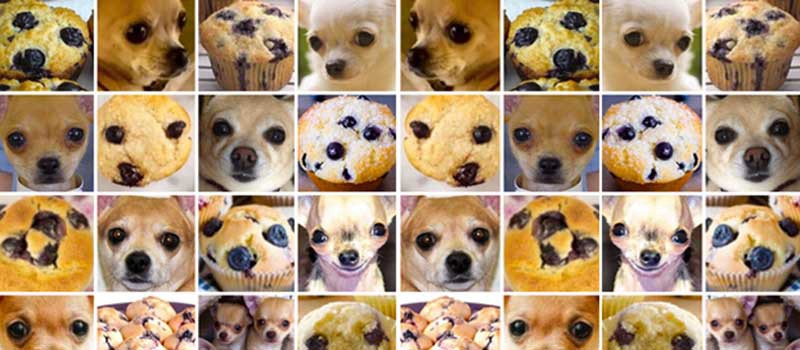

<a name="p1.1"></a>

---
### **Part 1.1: Building a Deep Neural Network for Image Classification**
---

In this section, you will follow the steps above to build, train, and evaluate a DNN model for binary image classification.

#### **Step #1: Import and split the data into a train/validation set**

The first step is to import and pre-process the data. This code is provided for you.

In [ ]:
!gdown 1-LmbZqBxEFMp3KZc7X1YobqolXAExZc0
!unzip -qq chihuahua_or_muffin.zip

# Select the directory where the data is saved
data_dir = 'chihuahua_or_muffin/'

# Set the path to the directory where your data is stored
train_directory = os.path.join(data_dir, 'train')
validation_directory = os.path.join(data_dir, 'validation')

# Setting the data directories for each class in the train set
train_chihuahua_dir = os.path.join(data_dir, 'train/chihuahua')
train_muffin_dir = os.path.join(data_dir, 'train/muffin')

# Setting the data directories for each class in the train set
validation_chihuahua_dir = os.path.join(data_dir, 'validation/chihuahua')
validation_muffin_dir = os.path.join(data_dir, 'validation/muffin')

Downloading...
From: https://drive.google.com/uc?id=1-LmbZqBxEFMp3KZc7X1YobqolXAExZc0
To: /content/chihuahua_or_muffin.zip
100% 512M/512M [00:11<00:00, 44.5MB/s]


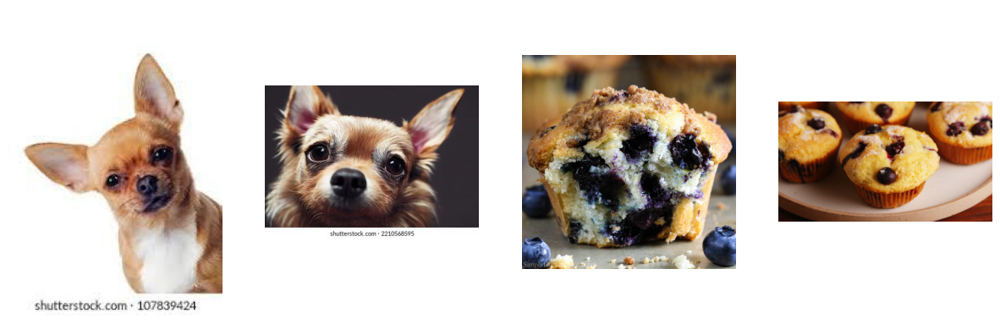

In [ ]:
#@title Plot some of the training data {display-mode: "form"}

# Plotting examples of training data
# Plotting examples from our image data
_, ax = plt.subplots(1, 4, figsize=(15,60))  # to show 4 images side by side, make a "1 row x 4 column" axes
ax[0].imshow(plt.imread(os.path.join(train_chihuahua_dir, "img_0_449.jpg")))  # show the chihuahua in the first column
ax[0].axis('off')
ax[1].imshow(plt.imread(os.path.join(train_chihuahua_dir, "img_0_439.jpg")))  # show the chihuahua in the second column
ax[1].axis('off')
ax[2].imshow(plt.imread(os.path.join(train_muffin_dir, "img_0_39.jpg")))  # show the muffin in the third column
ax[2].axis('off')
ax[3].imshow(plt.imread(os.path.join(train_muffin_dir, "img_0_44.jpg")))  # show the muffin in the fourth column
ax[3].axis('off')

plt.show()

Next, we will use `ImageDataGenerator` to preprocess the data efficiently and quickly. The ImageDataGenerator class will automatically generate batches of images and labels to feed into the model during training, which makes the process memory-efficient.

*This code is provided for you. Just run the cells below.*

In [ ]:
# Load the training data using the ImageDataGenerator class
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    train_directory,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

Found 4733 images belonging to 2 classes.


In [ ]:
# Load the validation data using the ImageDataGenerator class
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_directory(
    validation_directory,
    target_size=(150, 150),
    batch_size=32,
    shuffle = False,
    class_mode='binary'
)

Found 1184 images belonging to 2 classes.


#### **Step #2: Determine the input shape of the data**

**This step is given to you. Run the cell below.**

In [ ]:
# Define the input shape for the model
input_shape = (150, 150, 3)

#### **Steps #3-6: Building the Neural Network**

Initialize a `Sequential` neural network.

*(Hint: Remember for image data, the input layer needs to be flattened. The `flatten` layer is given to you.)*

Add two fully connected layers, each with 512 neurons and ReLU activation.



In [ ]:
# Initialize the model
model =

# Flatten image and add input layer
model.add(Flatten(input_shape = input_shape))

# Add fully connected layer with 512 neurons and ReLU activation

# Add fully connected layer with 512 neurons and ReLU activation

# Output layer
model.add(Dense(1, activation='sigmoid'))

Let's print a summary of the model to take a look at how many model parameters we have.

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 67500)             0         
                                                                 
 dense (Dense)               (None, 512)               34560512  
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 1)                 513       
                                                                 
Total params: 34823681 (132.84 MB)
Trainable params: 34823681 (132.84 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#### **Step #7: Training the Neural Network**



Use `binary crossentropy` for the loss function, `optimizer='adam'`, and `metrics = ['accuracy']` as the evaluation metric.

**Note:** We use binary crossentropy for the loss since this is a classification problem (chihuahua or muffin classes).

*The code for fitting the model is given to you.*


In [ ]:
# Compile the model
# WRITE YOUR CODE HERE

# Train the model using the generator
history = model.fit(
    train_generator,
    steps_per_epoch=10,
    epochs=8,
    validation_data=validation_generator,
    validation_steps=20
)

#### **Step #8: Evaluate the Model**

First, we make the predictions. Then, we visualize them.


In [ ]:
# Reset indices in generator
validation_generator.reset()

# Predict the class probabilities for the validation data
pred_probs = model.predict(validation_generator)

37/37 [==============================] - 6s 155ms/step


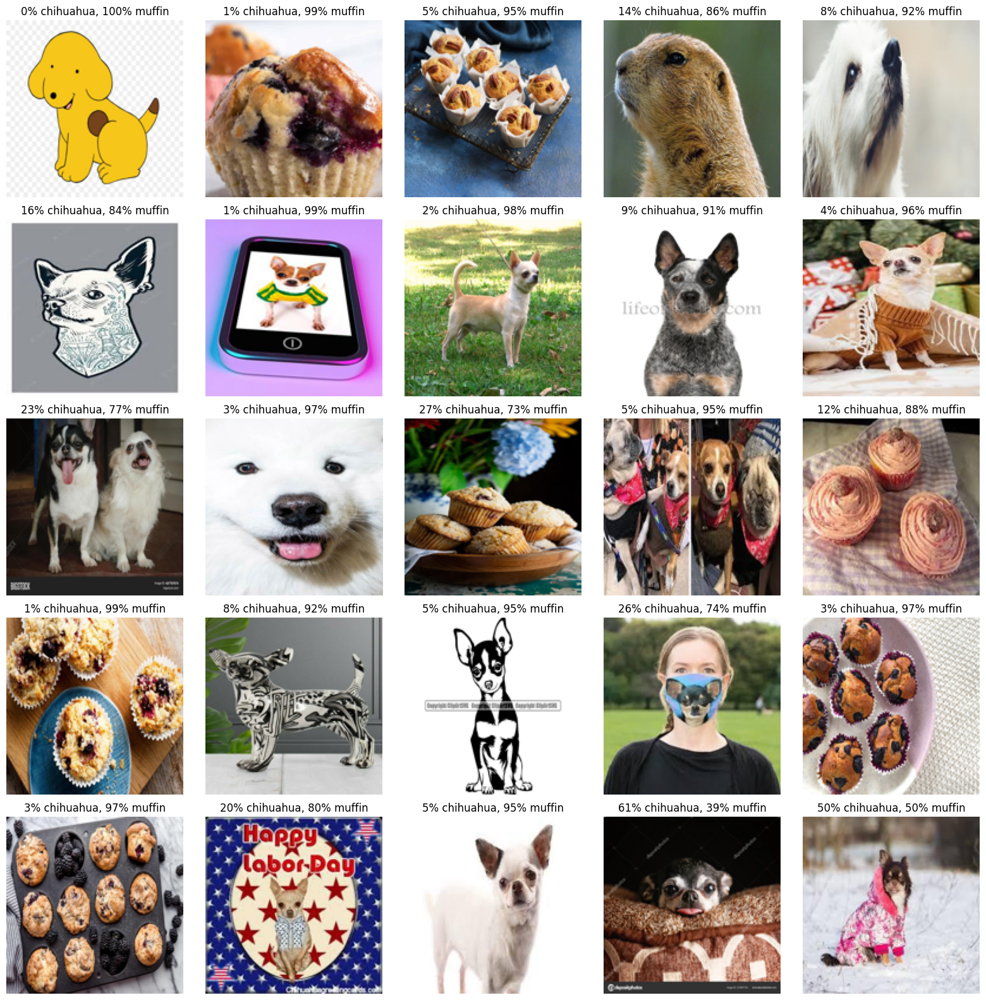

In [ ]:
#@title Visualize the result by examining a sample of the predictions. {display-mode: "form"}


# Create grid for images
fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(5, 5),  # creates 2x2 grid of axes
                 axes_pad=0.35,  # pad between axes in inch.
                 )

validation_generator.reset()
for ax, i in zip(grid, random.sample(range(0, 1000), 25)):
    img = PILImage.open(os.path.join(validation_directory,validation_generator.filenames[i]))
    img = img.resize((150,150))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title("{:.0f}% chihuahua, {:.0f}% muffin".format(100*(1-pred_probs[i][0]), 100*pred_probs[i][0], fontsize=15))

plt.show()

37/37 [==============================] - 6s 161ms/step - loss: 1.4424 - accuracy: 0.4704


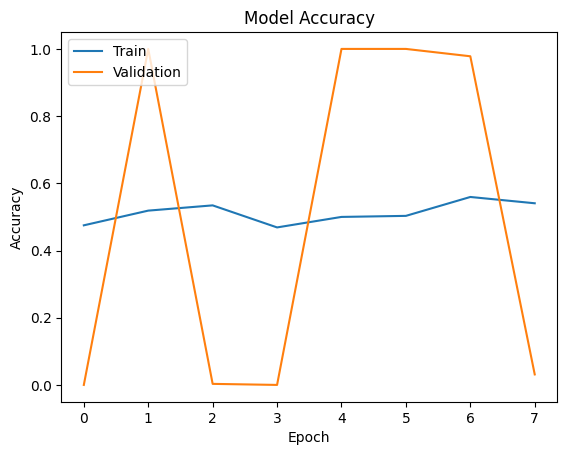

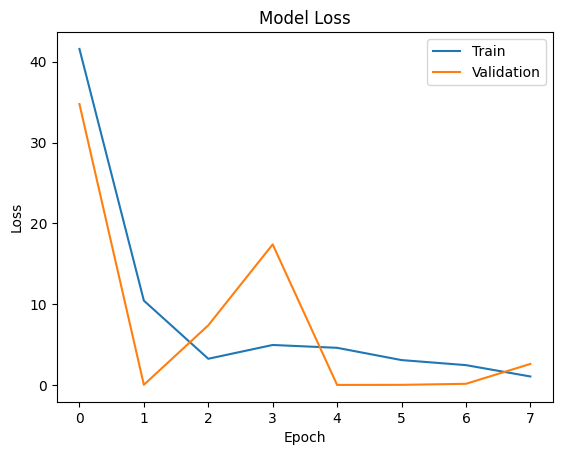

In [ ]:
#@title Print and plot loss and accuracy. {display-mode: "form"}

val_loss, val_accuracy = model.evaluate(validation_generator, steps=None)

# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

**Reflect**: As you see the model did not perform that well. Even though Deep Learning is preferred to traditional Machine Learning models, it still struggles to recognize whether the input image is a chihuahua or muffin. Let's see if another architecture can do better - **Convolutional Neural Networks**.

<a name="p1.2"></a>

---
### **Part 1.2: Building a Convolutional Neural Network for Image Classification**
---

The steps for making a convolutional neural network are the same. The only difference is we now have two new types of special layers in our toolkit: the convolutional layer and the max pooling layer.


#### **Steps #3-6: Building the Neural Network**

We define a convolutional layer using  `Conv2D(filters,kernel_size,activation)`.

* `filters` is the number of filters (filters are also called kernels).
* `kernel_size` is the size of the kernel. For example, `(2,2)`.
* `activation` is the activation function.

*We can tell this function to also add an input layer by passing `input_shape` as an optional argument.* For example, an initial convolutional layer using 12 filters and a filter size of 2x2 with a sigmoid activation function can be added as follows:

 `model.add(Conv2D(12, (2,2), activation='sigmoid', input_shape=input_shape))`




**Problem #1.2.1:** Together, let's initialize the network with `Sequential` and add the first convolutional layer with 32 filters, a kernel size of (3,3) and ReLU activation.

In [ ]:
# Initialize the model

# Add the first convolutional layer




**Problem #1.2.2:** Together, add a max pooling layer with a pool size of 2x2.

Remember that every convolutional layer will be followed by a max pooling layer. The `keras` function to add this layer is `MaxPooling2D(pool_size)`.

In [ ]:
# Add a max pooling layer

Now, we add a few more convolutional layers, all followed by the max pooling layers.
*This step is given to you. Run the cell below.*

In [ ]:
# Add the second convolutional layer
model.add(Conv2D(64, (3, 3), activation='relu'))

# Add a max pooling layer
model.add(MaxPooling2D((2, 2)))

# Add the third convolutional layer
model.add(Conv2D(128, (3, 3), activation='relu'))

# Add a max pooling layer
model.add(MaxPooling2D((2, 2)))


**Problem #1.2.3:** Finally, we will flatten the output and add a fully connected layer before the output. We will add the flatten layer for you. On your own, add the fully connected layer with 512 neurons and ReLU activation and the output layer.

In [ ]:
# Flatten the output from the convolutional layers
model.add(Flatten())

# Add a fully connected layer
# WRITE YOUR CODE HERE

# Add the output layer
# WRITE YOUR CODE HERE

Let's take a look at the parameters in our model.

<br>

#####***STOP!* Answer the following question: Do you think there will be more parameters to train or fewer parameters than for the fully connected network in Part 1.1?**

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)      

#### **Step #7: Training the Neural Network**

Let's now compile the model with the same parameters as in part 1.

*This step is given to you*

In [ ]:
# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model using the generator
history = model.fit(
    train_generator,
    steps_per_epoch=10,
    epochs=5,
    validation_data=validation_generator,
    validation_steps=20
)

Epoch 1/5
10/10 [==============================] - 8s 424ms/step - loss: 1.1565 - accuracy: 0.5094 - val_loss: 0.6344 - val_accuracy: 0.9312
Epoch 2/5
10/10 [==============================] - 7s 726ms/step - loss: 0.6766 - accuracy: 0.5906 - val_loss: 0.6982 - val_accuracy: 0.6062
Epoch 3/5
10/10 [==============================] - 4s 427ms/step - loss: 0.5845 - accuracy: 0.7094 - val_loss: 0.8547 - val_accuracy: 0.5297
Epoch 4/5
10/10 [==============================] - 6s 495ms/step - loss: 0.5586 - accuracy: 0.7287 - val_loss: 0.4634 - val_accuracy: 0.8266
Epoch 5/5
10/10 [==============================] - 4s 456ms/step - loss: 0.4316 - accuracy: 0.8031 - val_loss: 0.3794 - val_accuracy: 0.8578


#### **Step #8: Evaluate the Model**


First, we make the predictions. Then, we visualize them.

In [ ]:
# Reset indices in generator (sometimes it can get reindexed in a weird way)
validation_generator.reset()

# Predict the class probabilities for the validation data
pred_probs = model.predict(validation_generator)

37/37 [==============================] - 27s 705ms/step


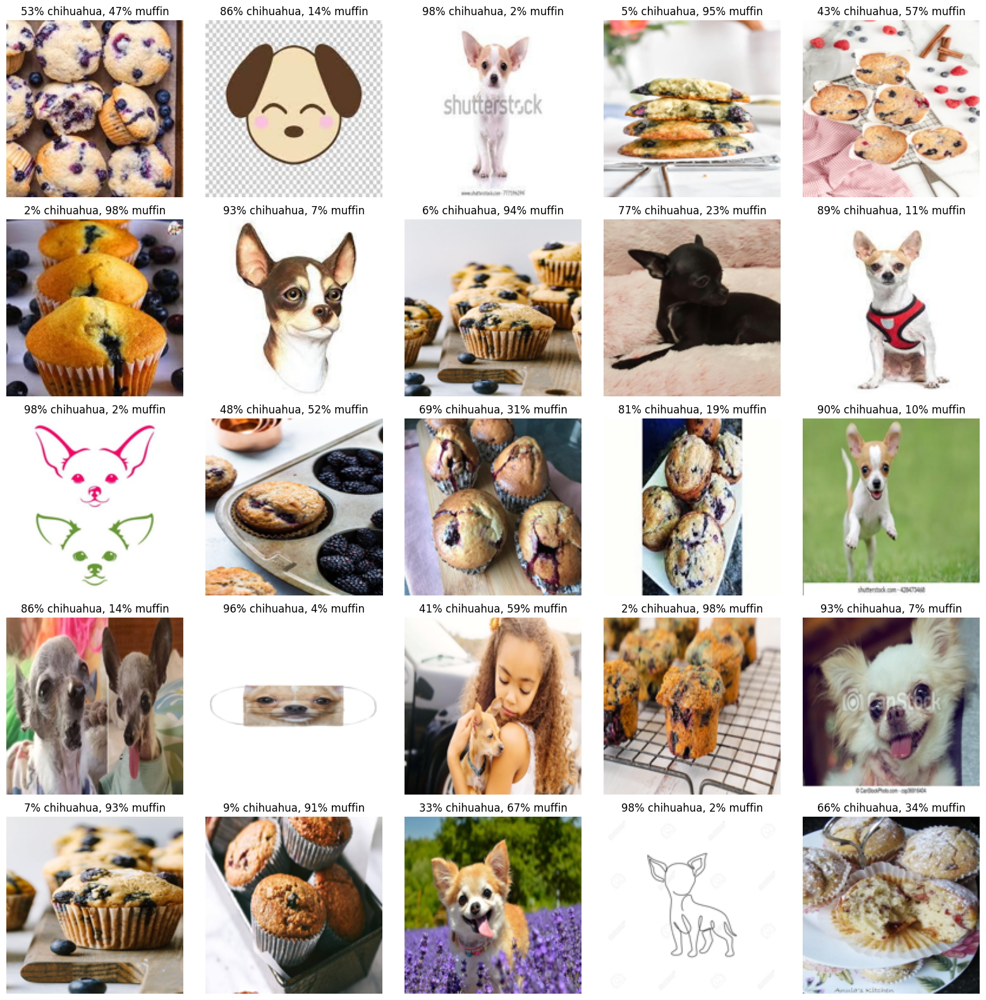

In [ ]:
#@title Visualize the result by examining a sample of the predictions. {display-mode: "form"}


# Create grid for images
fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(5, 5),  # creates 2x2 grid of axes
                 axes_pad=0.35,  # pad between axes in inch.
                 )

validation_generator.reset()
for ax, i in zip(grid, random.sample(range(0, 1000), 25)):
    img = PILImage.open(os.path.join(validation_directory,validation_generator.filenames[i]))
    img = img.resize((150,150))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title("{:.0f}% chihuahua, {:.0f}% muffin".format(100*(1-pred_probs[i][0]), 100*pred_probs[i][0], fontsize=15))

plt.show()

20/20 [==============================] - 3s 126ms/step - loss: 0.3794 - accuracy: 0.8578


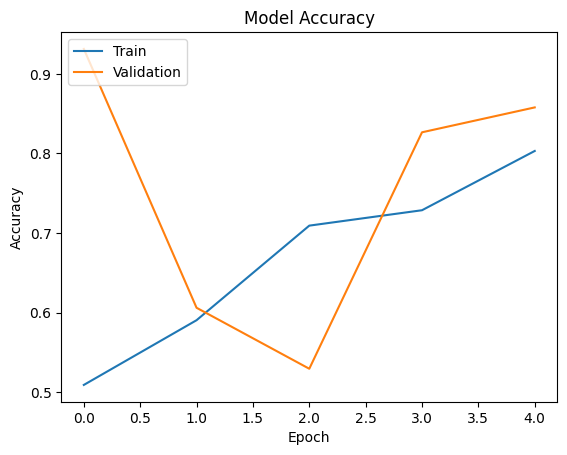

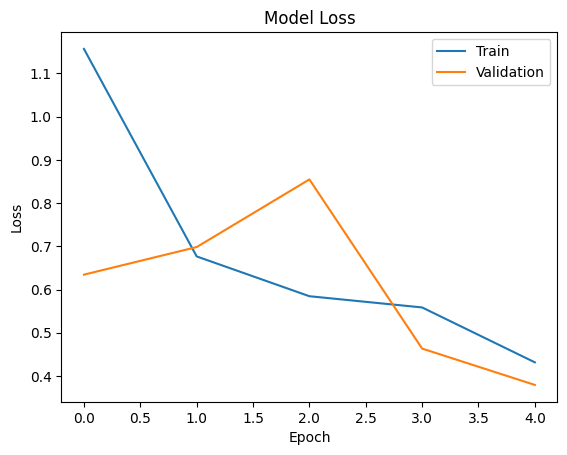

In [ ]:
#@title Print and plot loss and accuracy. {display-mode: "form"}

val_loss, val_accuracy = model.evaluate(validation_generator, steps=20)

# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

<br>

##### ***Reflect: What do you notice about the results?***
<br>


**Congratulations on finishing this notebook!** You should be proud of yourself! You are now able to implement from scratch advanced deep learning models aimed to recognize objects and images that are often challenging for computers to recognize.

As you saw, the CNN performs much better than the previous DNN. The steps of implementing a neural network both for deep learning and CNNs are quite similar but CNNs are often prefered for image classification and object recognition tasks because of the higher accuracy of the results while using less parameters. We're excited to see what will you build in the future using CNNs!

<a name="p2"></a>

---
## **Part 2: Using a Pre-Trained Model**
---

One way to improve our model would be to train it on more data. Unfortunately, we don't always have access to more data. In this part we will use **transfer learning** which means we will use a model that has been previously trained on a large dataset and modify it for our needs. Today, we will use the VGG16 model, which is a CNN with 16 layers that has been trained on the ImageNet dataset. We will use this model to classify images into two categories: 'alpaca' or 'not alpaca'




#### **Step #1: Import and split the data into a train/test set**

**Together**, we will import, pre-process the data, and split it into a training and validation set. We will use the validation set to help us improve the model in the next section.

<br>

The first step is to import and pre-process the data.

In [ ]:
!gdown 1Dc9qpV80dgZcFzxw_n3Rx8adsnAM_P1d && unzip -qq alpaca_not_alpaca.zip

Downloading...
From: https://drive.google.com/uc?id=1Dc9qpV80dgZcFzxw_n3Rx8adsnAM_P1d
To: /content/alpaca_not_alpaca.zip
100% 122M/122M [00:02<00:00, 44.2MB/s]


In [ ]:
# Remember that the batch size is the number of images that will be processed
# the model is updated. One epoch is one full pass through the dataset.
BATCH_SIZE = 32

# Size of the images. If the input images are a different size, they will be
# resized to these dimensions.
IMG_SIZE = (160, 160)

# Directory the data is saved.
directory = "dataset/"

# We are using keras's image_dataset_from_directory function to load the images
# from the directory. When we use this function, we can tell keras if it is a
# validation or training set. Just make sure to use the same seed for both to
# make sure there is no overlap in the datasets.
train_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.2,
                                             subset='training',
                                             seed=42)

validation_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.2,
                                             subset='validation',
                                             seed=42)

Found 327 files belonging to 2 classes.
Using 262 files for training.
Found 327 files belonging to 2 classes.
Using 65 files for validation.


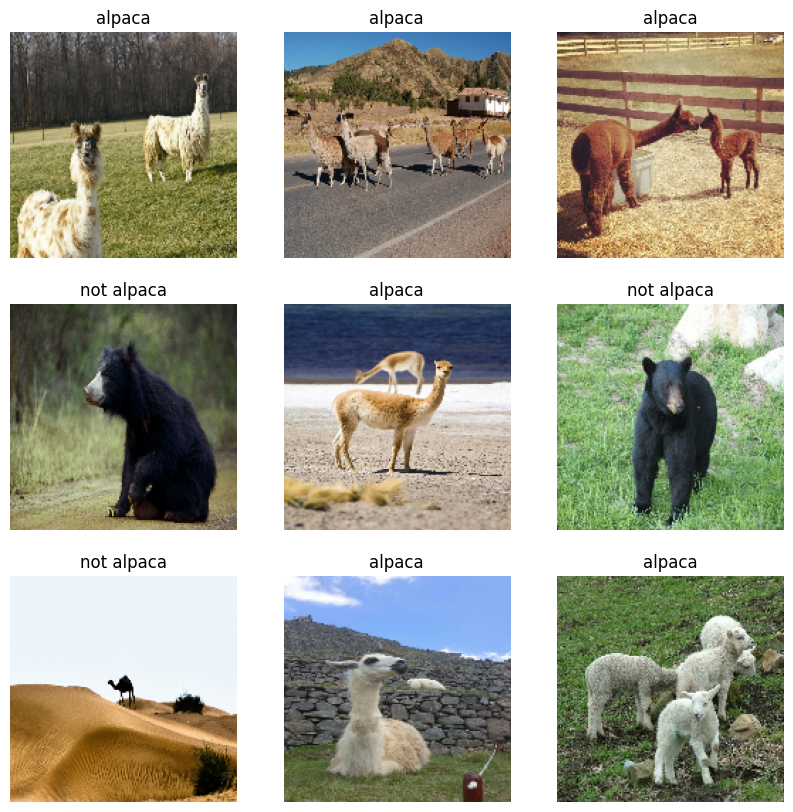

In [ ]:
# Get the names of each class from the dataset. In this case, the class is
# "alpaca" or "not alpaca"
class_names = train_dataset.class_names

# We'll take 9 images from the training dataset to plot
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

#### **Step #2: Defining the input shape of the data**

In [ ]:
# Define the input shape for the model
input_shape = (160, 160, 3)

#### **Steps #3-6: Build a new neural network using a pre-trained model**





In [ ]:
# Initialize the model
new_model = Sequential()

# Add input layer
new_model.add(Input(shape=input_shape))

# Add data augmentation layers
new_model.add(RandomFlip('horizontal'))
new_model.add(RandomRotation(0.2))

# You do not need to worry about this step. But in case you are curious:
# The "Lambda" layer is another special layer that let's you apply a custom
# function to the data. Because we know we're going to use VGG16, we will use
# the same pre-processing function that was used when it was first trained.
new_model.add(
    Lambda(
        preprocess_input,
        name='preprocessing',
        input_shape=input_shape
    )
)

# Load a pre-trained model
VGG = VGG16(
    # we want to use our own final layers customized for our task
    include_top=False,
    input_shape=input_shape,
    weights='imagenet'
    )

# Freeze parameters each layer because we only want to train the final layers
for layer in VGG.layers:
  layer.trainable = False

# Add the pre-trained model to our model
new_model.add(VGG)

# Add a flattening layer
new_model.add(Flatten())

# Add a fully connected layer
new_model.add(Dense(256, activation='relu'))

# Add the output layer
new_model.add(Dense(1, activation='sigmoid'))

new_model.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip_3 (RandomFlip)  (None, 160, 160, 3)       0         
                                                                 
 random_rotation_3 (RandomR  (None, 160, 160, 3)       0         
 otation)                                                        
                                                                 
 preprocessing (Lambda)      (None, 160, 160, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 12800)             0         
                                                                 
 dense_10 (Dense)            (None, 256)               3277056   
                                                      

In [ ]:
new_model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy'])

history = new_model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=10)

Epoch 1/10
9/9 [==============================] - 12s 585ms/step - loss: 15.3684 - accuracy: 0.6489 - val_loss: 4.5287 - val_accuracy: 0.6769
Epoch 2/10
9/9 [==============================] - 3s 131ms/step - loss: 1.2344 - accuracy: 0.8321 - val_loss: 0.6877 - val_accuracy: 0.8923
Epoch 3/10
9/9 [==============================] - 2s 128ms/step - loss: 0.5203 - accuracy: 0.8664 - val_loss: 0.6637 - val_accuracy: 0.8923
Epoch 4/10
9/9 [==============================] - 2s 126ms/step - loss: 0.3314 - accuracy: 0.8779 - val_loss: 1.2625 - val_accuracy: 0.8308
Epoch 5/10
9/9 [==============================] - 2s 128ms/step - loss: 0.2806 - accuracy: 0.9046 - val_loss: 0.9496 - val_accuracy: 0.8462
Epoch 6/10
9/9 [==============================] - 3s 165ms/step - loss: 0.2378 - accuracy: 0.9504 - val_loss: 0.5563 - val_accuracy: 0.8615
Epoch 7/10
9/9 [==============================] - 2s 128ms/step - loss: 0.1836 - accuracy: 0.9237 - val_loss: 0.3066 - val_accuracy: 0.9385
Epoch 8/10
9/9 [==

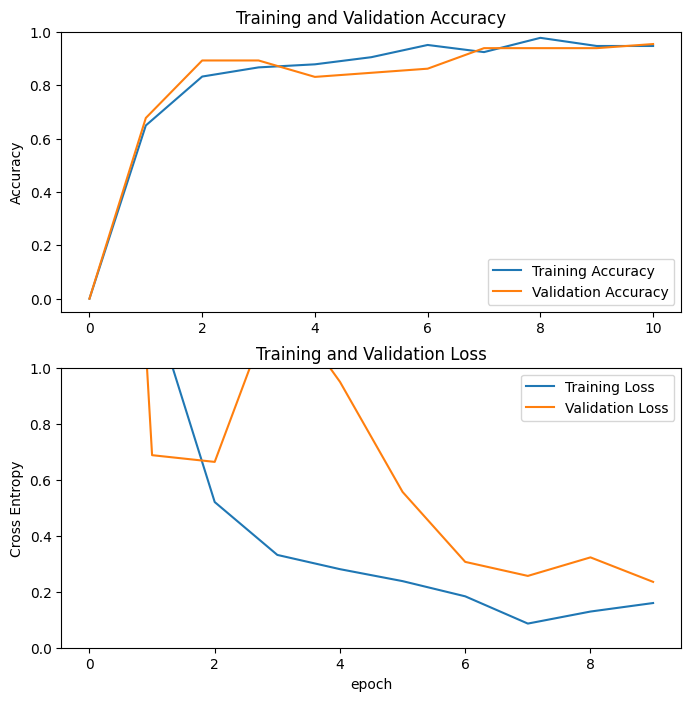

In [ ]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

1/1 [==============================] - 0s 23ms/step


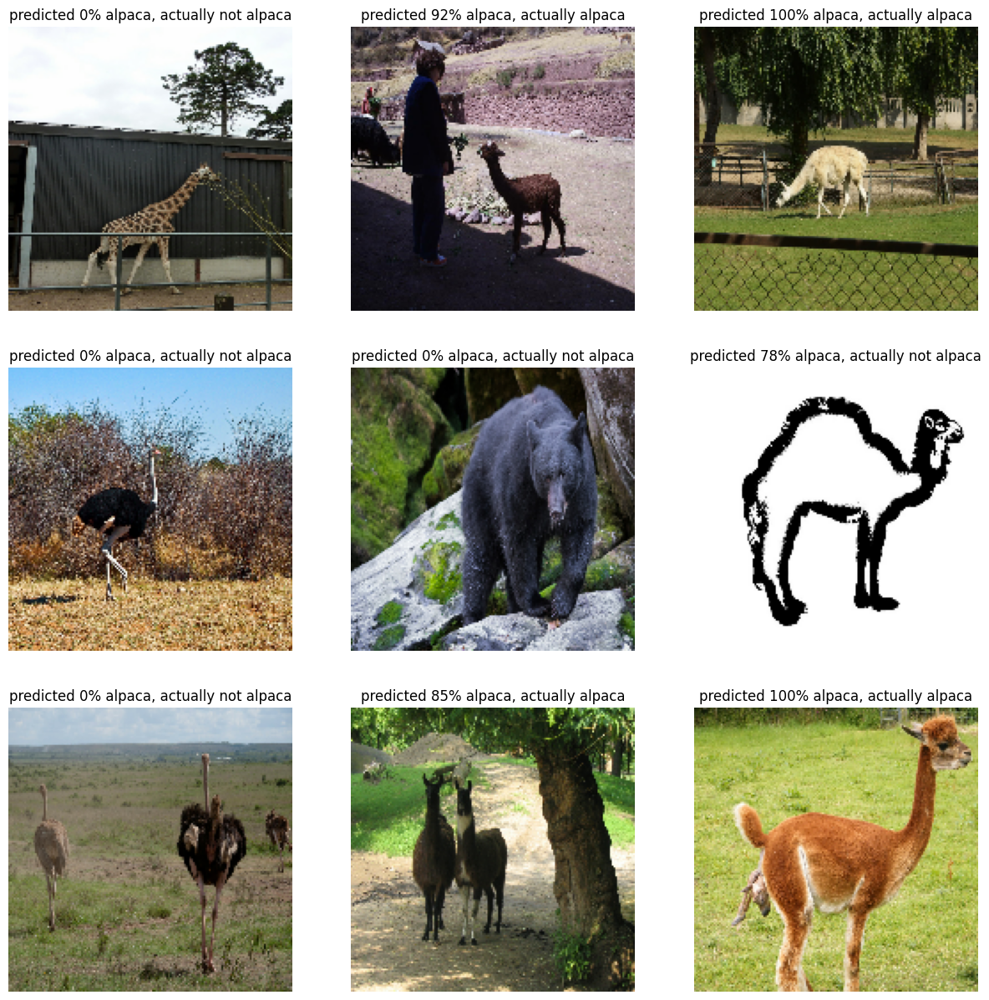

In [ ]:
# We'll take 9 images from the validation dataset to plot
plt.figure(figsize=(15, 15))
for x, y in validation_dataset.take(1):
    for i in range(9):
        prediction = new_model.predict(x)[i]
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(x[i].numpy().astype("uint8"))
        tmp2 = "predicted {:.0f}% alpaca, actually ".format(100*(1-prediction[0]), fontsize=14)
        plt.title(tmp2 + class_names[y[i].numpy()])
        plt.axis("off")

# End of notebook
---
© 2024 The Coding School, All rights reserved